## Project Gole: 
focuses on classifying weather images using convolutional neural networks and transfer learning techniques. The goal is to train a model that can accurately recognize 8 different weather conditions from images.”



In [4]:
import os
import glob
import shutil
import random
from pathlib import Path
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, Callback, ReduceLROnPlateau, ModelCheckpoint
from sklearn.utils import shuffle
from PIL import Image
from tensorflow.keras import layers
from collections import Counter
import matplotlib.pyplot as plt
from datetime import datetime


## Data Loading and Preprocessing


- relize all images to 240*240
- Using 'categorical' encoding since we have multiple weather classes (this will create one-hot   encoded labels)


In [5]:
data_dir = r"C:\Users\Hibatullah\CA\DL\Project\weather"
batch_size = 32
img_height = 240
img_width = 240
seed = 123

train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=True,
    label_mode='categorical',
    seed=seed
)


Found 3115 files belonging to 8 classes.


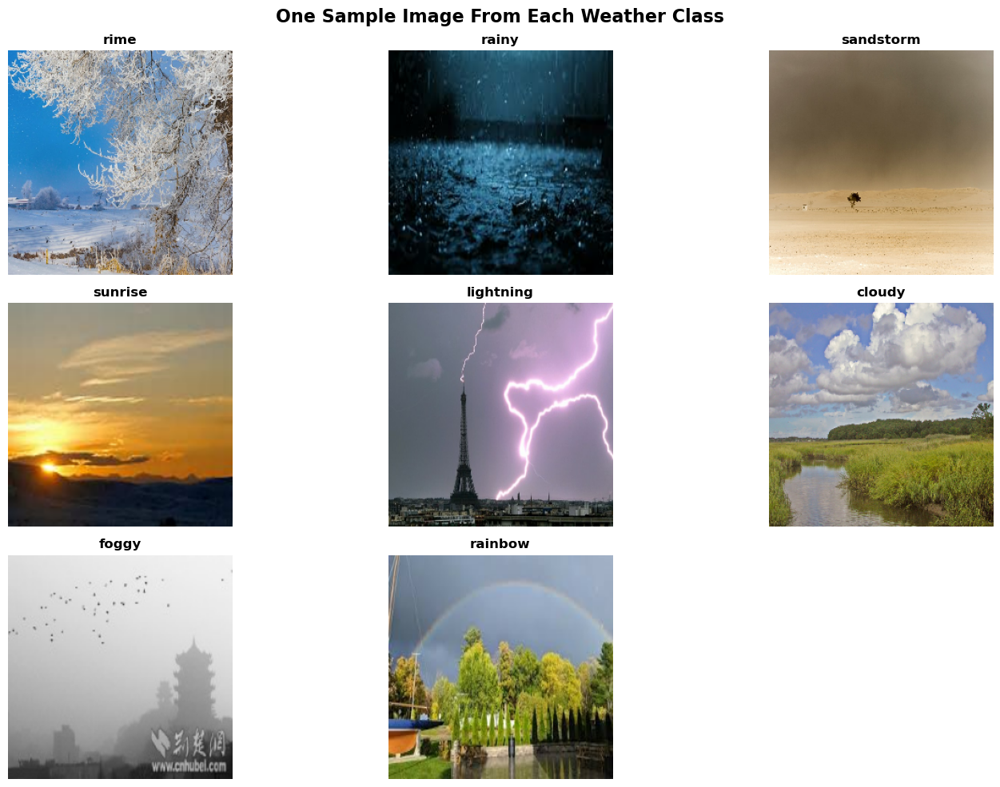

In [94]:
class_names = train_ds.class_names
num_classes = len(class_names)

plt.figure(figsize=(15, 10))
displayed_classes = set()
images_to_show = []

for batch in train_ds:
    images, labels = batch
    for i in range(images.shape[0]):
        image = images[i]
        label = labels[i].numpy()

        if label not in displayed_classes:
            images_to_show.append((image, label))
            displayed_classes.add(label)

        if len(images_to_show) == num_classes:
            break
    if len(images_to_show) == num_classes:
        break

rows = (num_classes + 2) // 3
for i, (image, label_idx) in enumerate(images_to_show):
    ax = plt.subplot(rows, 3, i + 1)
    plt.imshow(image.numpy().astype("uint8"))
    plt.title(f"{class_names[label_idx]}", fontsize=12, fontweight='bold')
    plt.axis("off")

plt.suptitle("One Sample Image From Each Weather Class", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


- This step ensures that all images in our dataset are properly formatted before we begin the actual machine learning pipeline.

In [6]:
def rename_images_to_jpg(dataset_path=r'C:\Users\Hibatullah\CA\DL\Project\weather'):
    weather_classes = ['cloudy', 'foggy', 'lightning', 'rainbow', 'rainy', 'rime', 'sandstorm', 'sunrise']
    
    renamed = {cls: 0 for cls in weather_classes}
    for cls in weather_classes:
        folder = Path(dataset_path) / cls
        
        if not folder.exists():
            print(f"Warning: Folder '{cls}' not found at {folder}")
            continue
            
        for f in folder.glob('*'):
            if f.suffix.lower() not in ('.jpg',):
                try:
                    new = f.with_suffix('.jpg')
                    Image.open(f).convert('RGB').save(new, 'JPEG')
                    f.unlink()
                    renamed[cls] += 1
                    
                except Exception as e:
                    print(f"Error processing {f}: {e}")
    
    print(f"Renamed: {renamed}")
    return renamed

rename_images_to_jpg()

Renamed: {'cloudy': 0, 'foggy': 0, 'lightning': 0, 'rainbow': 0, 'rainy': 0, 'rime': 0, 'sandstorm': 0, 'sunrise': 0}


{'cloudy': 0,
 'foggy': 0,
 'lightning': 0,
 'rainbow': 0,
 'rainy': 0,
 'rime': 0,
 'sandstorm': 0,
 'sunrise': 0}

# Dataset Splitting

In [7]:
import os
import random
import shutil
from PIL import Image

def split_weather_dataset(
    source_path=r'C:\Users\Hibatullah\CA\DL\Project\weather', 
    output_path=r'C:\Users\Hibatullah\CA\DL\Project\split_dataset',
    train_ratio=0.8, val_ratio=0.1, test_ratio=0.1,
    seed=123
):
    random.seed(seed)
    weather_classes = ['cloudy', 'foggy', 'lightning', 'rainbow', 'rainy', 'rime', 'sandstorm', 'sunrise']
    splits = ['train', 'validation', 'test']

    for split in splits:
        for cls in weather_classes:
            split_dir = os.path.join(output_path, split, cls)
            os.makedirs(split_dir, exist_ok=True)

    split_stats = {cls: {'train': 0, 'validation': 0, 'test': 0} for cls in weather_classes}

    for cls in weather_classes:
        source_cls_path = os.path.join(source_path, cls)
        if not os.path.exists(source_cls_path):
            print(f"Warning: Source folder '{cls}' not found at {source_cls_path}")
            continue

        image_files = [f for f in os.listdir(source_cls_path) if os.path.isfile(os.path.join(source_cls_path, f))]
        random.shuffle(image_files)

        total_files = len(image_files)
        print(f"Processing {cls}: {total_files} files")

        if total_files == 0:
            print(f"Warning: No image files found in {cls}")
            continue

        train_end = int(total_files * train_ratio)
        val_end = train_end + int(total_files * val_ratio)

        train_files = image_files[:train_end]
        val_files = image_files[train_end:val_end]
        test_files = image_files[val_end:]

        def convert_and_save(src_path, dst_path):
            try:
                with Image.open(src_path) as img:
                    rgb_img = img.convert('RGB')  # Convert to RGB for JPEG compatibility
                    dst_path = os.path.splitext(dst_path)[0] + '.jpg'  # Ensure .jpg extension
                    rgb_img.save(dst_path, 'JPEG')
            except Exception as e:
                print(f"Error converting {src_path}: {e}")

        for file in train_files:
            src = os.path.join(source_cls_path, file)
            dst = os.path.join(output_path, 'train', cls, file)
            convert_and_save(src, dst)
            split_stats[cls]['train'] += 1

        for file in val_files:
            src = os.path.join(source_cls_path, file)
            dst = os.path.join(output_path, 'validation', cls, file)
            convert_and_save(src, dst)
            split_stats[cls]['validation'] += 1

        for file in test_files:
            src = os.path.join(source_cls_path, file)
            dst = os.path.join(output_path, 'test', cls, file)
            convert_and_save(src, dst)
            split_stats[cls]['test'] += 1

    print("\n" + "="*50)
    print("DATASET SPLIT SUMMARY")
    print("="*50)

    total_stats = {'train': 0, 'validation': 0, 'test': 0}

    for cls in weather_classes:
        print(f"\n{cls.upper()}:")
        print(f"  Train: {split_stats[cls]['train']}")
        print(f"  Validation: {split_stats[cls]['validation']}")
        print(f"  Test: {split_stats[cls]['test']}")

        total_stats['train'] += split_stats[cls]['train']
        total_stats['validation'] += split_stats[cls]['validation']
        total_stats['test'] += split_stats[cls]['test']

    print(f"\nTOTAL:")
    print(f"  Train: {total_stats['train']}")
    print(f"  Validation: {total_stats['validation']}")
    print(f"  Test: {total_stats['test']}")

    total_files = sum(total_stats.values())
    if total_files > 0:
        print(f"\nPERCENTAGES:")
        print(f"  Train: {total_stats['train']/total_files*100:.1f}%")
        print(f"  Validation: {total_stats['validation']/total_files*100:.1f}%")
        print(f"  Test: {total_stats['test']/total_files*100:.1f}%")

    print("="*50)
    print("Dataset split completed!")

    return split_stats

split_weather_dataset()


Processing cloudy: 349 files
Processing foggy: 384 files
Processing lightning: 400 files
Processing rainbow: 450 files
Processing rainy: 383 files
Processing rime: 400 files
Processing sandstorm: 400 files
Processing sunrise: 349 files

DATASET SPLIT SUMMARY

CLOUDY:
  Train: 279
  Validation: 34
  Test: 36

FOGGY:
  Train: 307
  Validation: 38
  Test: 39

LIGHTNING:
  Train: 320
  Validation: 40
  Test: 40

RAINBOW:
  Train: 360
  Validation: 45
  Test: 45

RAINY:
  Train: 306
  Validation: 38
  Test: 39

RIME:
  Train: 320
  Validation: 40
  Test: 40

SANDSTORM:
  Train: 320
  Validation: 40
  Test: 40

SUNRISE:
  Train: 279
  Validation: 34
  Test: 36

TOTAL:
  Train: 2491
  Validation: 309
  Test: 315

PERCENTAGES:
  Train: 80.0%
  Validation: 9.9%
  Test: 10.1%
Dataset split completed!


{'cloudy': {'train': 279, 'validation': 34, 'test': 36},
 'foggy': {'train': 307, 'validation': 38, 'test': 39},
 'lightning': {'train': 320, 'validation': 40, 'test': 40},
 'rainbow': {'train': 360, 'validation': 45, 'test': 45},
 'rainy': {'train': 306, 'validation': 38, 'test': 39},
 'rime': {'train': 320, 'validation': 40, 'test': 40},
 'sandstorm': {'train': 320, 'validation': 40, 'test': 40},
 'sunrise': {'train': 279, 'validation': 34, 'test': 36}}

- image[ convart all images to RGB format + Resize images to 240*240]
- convert pixel value from [0-255] to [0-1]

In [8]:
from pathlib import Path
from PIL import Image
import numpy as np
from sklearn.utils import shuffle
from tensorflow.keras.utils import to_categorical

def load_data(data_root, size=(240, 240)):
    weather_classes = ['cloudy', 'foggy', 'lightning', 'rainbow', 'rainy', 'rime', 'sandstorm', 'sunrise']
    
    X = []
    y = []

    for label, cls in enumerate(weather_classes):
        class_path = Path(data_root) / cls

        if not class_path.exists():
            print(f"Warning: folder '{cls}' not found at {class_path}")
            continue

        for f in class_path.glob('*.jpg'):
            try:
                img = Image.open(f).convert('RGB').resize(size)
                arr = np.asarray(img, dtype=np.float32) / 255.0
                X.append(arr)
                y.append(label)  
            except Exception as e:
                print(f"Skipped {f.name}: {e}")

    X, y = shuffle(X, y, random_state=123)
    X = np.array(X)
    y = np.array(y)
    y = to_categorical(y, num_classes=8)  # Convert to categorical (one-hot encoding)

    print(f"Loaded {len(X)} images: X shape = {X.shape}, y shape = {y.shape}")
    return X, y

X_train, y_train = load_data(r'C:\Users\Hibatullah\CA\DL\Project\split_dataset\train')
X_test, y_test = load_data(r'C:\Users\Hibatullah\CA\DL\Project\split_dataset\test')
X_val, y_val = load_data(r'C:\Users\Hibatullah\CA\DL\Project\split_dataset\validation')

Loaded 2491 images: X shape = (2491, 240, 240, 3), y shape = (2491, 8)
Loaded 315 images: X shape = (315, 240, 240, 3), y shape = (315, 8)
Loaded 309 images: X shape = (309, 240, 240, 3), y shape = (309, 8)


In [24]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory

# Define image dimensions and batch size
img_height = 240
img_width = 240
batch_size = 32

def load_keras_dataset(dataset_path=r"C:\Users\Hibatullah\CA\DL\Project\split_dataset", 
                       img_size=(img_height, img_width), 
                       batch_size=batch_size):

    train_ds = image_dataset_from_directory(
        os.path.join(dataset_path, 'train'),
        image_size=img_size,
        batch_size=batch_size,
        label_mode='categorical'
    ).prefetch(tf.data.AUTOTUNE)

    val_ds = image_dataset_from_directory(
        os.path.join(dataset_path, 'validation'), 
        image_size=img_size,
        batch_size=batch_size,
        label_mode='categorical'
    ).prefetch(tf.data.AUTOTUNE)

    test_ds = image_dataset_from_directory(
        os.path.join(dataset_path, 'test'), 
        image_size=img_size,
        batch_size=batch_size,
        label_mode='categorical'
    ).prefetch(tf.data.AUTOTUNE)

    return train_ds, val_ds, test_ds

# Call the function
weather_data_path = r"C:\Users\Hibatullah\CA\DL\Project\split_dataset"
train_ds, val_ds, test_ds = load_keras_dataset(weather_data_path)


Found 2491 files belonging to 8 classes.
Found 309 files belonging to 8 classes.
Found 315 files belonging to 8 classes.


### Sequancial API

- Batch Normalization:  keeps the training process stable and makes it faster.
- MaxPooling:it zooming the image size while keeping the most important parts.
- Padding = 'same':the output image stays the same size as the input after filtering.

In [108]:
def build_cnn_model(input_shape=(240, 240, 3), num_classes=8):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(64, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(128, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(256, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),

        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    
    model.summary()
    return model

model = build_cnn_model()


C:\Users\Hibatullah\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_88 (Conv2D)              │ (None, 240, 240, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_72          │ (None, 240, 240, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_61 (MaxPooling2D) │ (None, 120, 120, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_89 (Conv2D)              │ (None, 120, 120, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_73          │ (None, 120, 120, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_62 (MaxPooling2D) │ (None, 60, 60, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_90 (Conv2D)              │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_74          │ (None, 60, 60, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_63 (MaxPooling2D) │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_91 (Conv2D)              │ (None, 30, 30, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_75          │ (None, 30, 30, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_64 (MaxPooling2D) │ (None, 15, 15, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_13 (Flatten)            │ (None, 57600)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 256)            │    14,745,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_32 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,138,248 (57.75 MB)

 Trainable params: 15,137,288 (57.74 MB)

 Non-trainable params: 960 (3.75 KB)

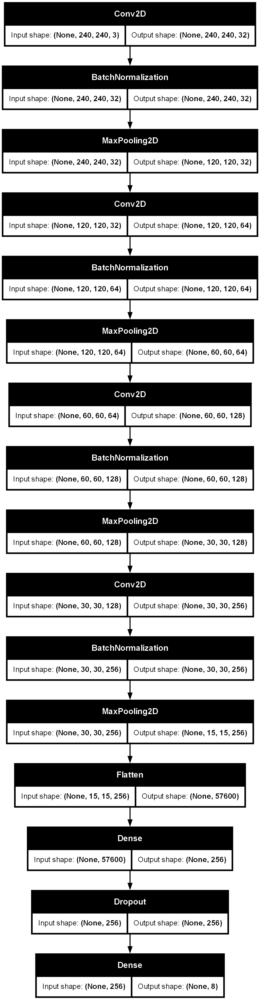

In [109]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [110]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

callbacks = [
    EarlyStopping(patience=10, restore_best_weights=True),
    ReduceLROnPlateau(factor=0.5, patience=5, min_lr=1e-6, verbose=1)
]

history = model.fit(
    train_df,
    validation_data=val_df,
    epochs=15,
    callbacks=callbacks
)


Epoch 1/15
78/78 ━━━━━━━━━━━━━━━━━━━━ 99s 1s/step - accuracy: 0.3727 - loss: 16.0811 - val_accuracy: 0.3204 - val_loss: 2.2887 - learning_rate: 0.0010
Epoch 2/15
78/78 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step - accuracy: 0.2689 - loss: 2.0976 - val_accuracy: 0.4628 - val_loss: 1.5379 - learning_rate: 0.0010
Epoch 3/15
78/78 ━━━━━━━━━━━━━━━━━━━━ 107s 1s/step - accuracy: 0.3322 - loss: 1.7953 - val_accuracy: 0.3689 - val_loss: 1.7278 - learning_rate: 0.0010
Epoch 4/15
78/78 ━━━━━━━━━━━━━━━━━━━━ 102s 1s/step - accuracy: 0.3923 - loss: 1.6627 - val_accuracy: 0.4628 - val_loss: 1.7921 - learning_rate: 0.0010
Epoch 5/15
78/78 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.4179 - loss: 1.5731 - val_accuracy: 0.5081 - val_loss: 1.2973 - learning_rate: 0.0010
Epoch 6/15
78/78 ━━━━━━━━━━━━━━━━━━━━ 125s 2s/step - accuracy: 0.4232 - loss: 1.5501 - val_accuracy: 0.5178 - val_loss: 1.3688 - learning_rate: 0.0010
Epoch 7/15
78/78 ━━━━━━━━━━━━━━━━━━━━ 132s 2s/step - accuracy: 0.4705 - loss: 1.4574 - val_acc

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step


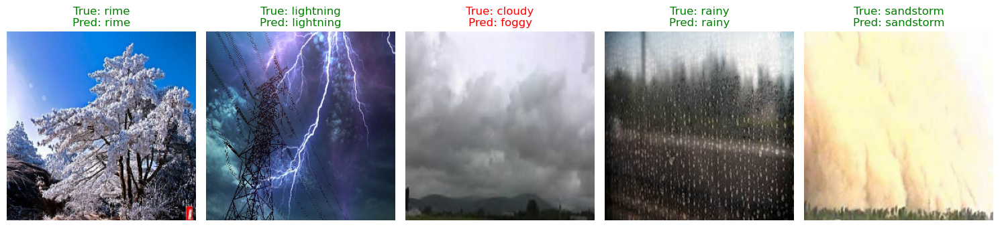

In [112]:

class_names = train_ds.class_names

def show_predictions(model, dataset, num_images=5):
    plt.figure(figsize=(15, 8))

    for images, labels in dataset.take(1):
        preds = model.predict(images)
        pred_labels = tf.argmax(preds, axis=1)
        true_labels = tf.argmax(labels, axis=1)

        for i in range(num_images):
            ax = plt.subplot(1, num_images, i+1)
            plt.imshow(images[i].numpy().astype("uint8"))
            pred_class = class_names[pred_labels[i]]
            true_class = class_names[true_labels[i]]
            plt.title(f"True: {true_class}\nPred: {pred_class}",
                      color=("green" if pred_class == true_class else "red"))
            plt.axis("off")

    plt.tight_layout()
    plt.show()

show_predictions(model, val_df)

# VGG-19

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_80 (Conv2D)              │ (None, 240, 240, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_68          │ (None, 240, 240, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_55 (MaxPooling2D) │ (None, 120, 120, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_81 (Conv2D)              │ (None, 120, 120, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_69          │ (None, 120, 120, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_56 (MaxPooling2D) │ (None, 60, 60, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_82 (Conv2D)              │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_70          │ (None, 60, 60, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_57 (MaxPooling2D) │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_83 (Conv2D)              │ (None, 30, 30, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_71          │ (None, 30, 30, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_58 (MaxPooling2D) │ (None, 15, 15, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_12 (Flatten)            │ (None, 57600)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 256)            │    14,745,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,138,248 (57.75 MB)

 Trainable params: 15,137,288 (57.74 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/10
78/78 ━━━━━━━━━━━━━━━━━━━━ 96s 1s/step - accuracy: 0.3846 - loss: 15.6216 - val_accuracy: 0.3010 - val_loss: 2.9091 - learning_rate: 0.0010
Epoch 2/10
78/78 ━━━━━━━━━━━━━━━━━━━━ 98s 1s/step - accuracy: 0.3106 - loss: 2.1367 - val_accuracy: 0.4272 - val_loss: 1.6227 - learning_rate: 0.0010
Epoch 3/10
78/78 ━━━━━━━━━━━━━━━━━━━━ 102s 1s/step - accuracy: 0.3670 - loss: 1.7686 - val_accuracy: 0.4563 - val_loss: 1.5440 - learning_rate: 0.0010
Epoch 4/10
78/78 ━━━━━━━━━━━━━━━━━━━━ 101s 1s/step - accuracy: 0.3685 - loss: 1.7395 - val_accuracy: 0.5178 - val_loss: 1.4617 - learning_rate: 0.0010
Epoch 5/10
78/78 ━━━━━━━━━━━━━━━━━━━━ 99s 1s/step - accuracy: 0.4172 - loss: 1.5794 - val_accuracy: 0.4498 - val_loss: 1.9317 - learning_rate: 0.0010
Epoch 6/10
78/78 ━━━━━━━━━━━━━━━━━━━━ 100s 1s/step - accuracy: 0.4562 - loss: 1.5345 - val_accuracy: 0.5534 - val_loss: 1.3958 - learning_rate: 0.0010
Epoch 7/10
78/78 ━━━━━━━━━━━━━━━━━━━━ 102s 1s/step - accuracy: 0.4510 - loss: 1.5156 - val_accur

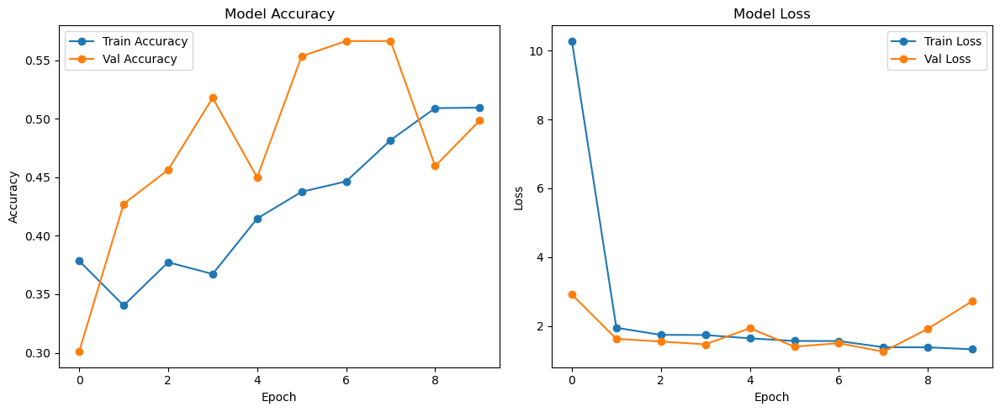

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


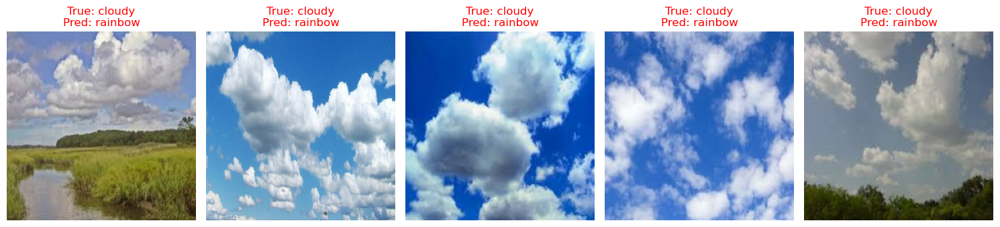

In [101]:
from tensorflow.keras import layers, models

def build_vgg19(input_shape=(224, 224, 3), num_classes=8):
    model = models.Sequential()

    # Block 1
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape))
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # Block 2
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # Block 3
    model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # Block 4
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # Block 5
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

    # Fully connected layers
    model.add(layers.Flatten())
    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model


model = build_cnn_model()


tf.keras.utils.plot_model(model, show_shapes=True, to_file="model_architecture.png")

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=5, min_lr=1e-6, verbose=1)
]

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    callbacks=callbacks
)

def plot_training_history(history):
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy', marker='o')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Val Loss', marker='o')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_training_history(history)

def show_predictions(model, dataset, class_names, num_images=5):
    plt.figure(figsize=(15, 8))

    for images, labels in dataset.take(1):
        preds = model.predict(images)
        pred_labels = tf.argmax(preds, axis=1)
        true_labels = tf.argmax(labels, axis=1)

        for i in range(num_images):
            ax = plt.subplot(1, num_images, i+1)
            plt.imshow(images[i].numpy().astype("uint8"))
            pred_class = class_names[pred_labels[i]]
            true_class = class_names[true_labels[i]]
            plt.title(f"True: {true_class}\nPred: {pred_class}",
                      color=("green" if pred_class == true_class else "red"))
            plt.axis("off")

    plt.tight_layout()
    plt.show()

show_predictions(model, val_ds, class_names)


# Functional 

- Batch Normalization:  keeps the training process stable and makes it faster.
- MaxPooling:it zooming the image size while keeping the most important parts.
- Padding = 'same':the output image stays the same size as the input after filtering.

Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_27 (InputLayer)     │ (None, 240, 240, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_84 (Conv2D)              │ (None, 240, 240, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_85 (Conv2D)              │ (None, 240, 240, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_59 (MaxPooling2D) │ (None, 120, 120, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_86 (Conv2D)              │ (None, 120, 120, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_87 (Conv2D)              │ (None, 120, 120, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_60 (MaxPooling2D) │ (None, 60, 60, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_14     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_56 (Dense)                │ (None, 200)            │        13,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_30 (Dropout)            │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 100)            │        20,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 8)              │           808 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 99,476 (388.58 KB)

 Trainable params: 99,476 (388.58 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 88s 1s/step - accuracy: 0.1869 - loss: 3.8821 - val_accuracy: 0.3560 - val_loss: 1.5388 - learning_rate: 0.0010
Epoch 2/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 102s 1s/step - accuracy: 0.3145 - loss: 1.6707 - val_accuracy: 0.4984 - val_loss: 1.3517 - learning_rate: 0.0010
Epoch 3/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 101s 1s/step - accuracy: 0.4566 - loss: 1.4301 - val_accuracy: 0.5955 - val_loss: 1.1957 - learning_rate: 0.0010
Epoch 4/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 100s 1s/step - accuracy: 0.5083 - loss: 1.3635 - val_accuracy: 0.5243 - val_loss: 1.2050 - learning_rate: 0.0010
Epoch 5/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 103s 1s/step - accuracy: 0.5161 - loss: 1.2835 - val_accuracy: 0.6084 - val_loss: 1.0272 - learning_rate: 0.0010
Epoch 6/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 104s 1s/step - accuracy: 0.5966 - loss: 1.1461 - val_accuracy: 0.6828 - val_loss: 0.8725 - learning_rate: 0.0010
Epoch 7/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 101s 1s/step - accuracy: 0.6414 - loss: 0.9767 - val_accu

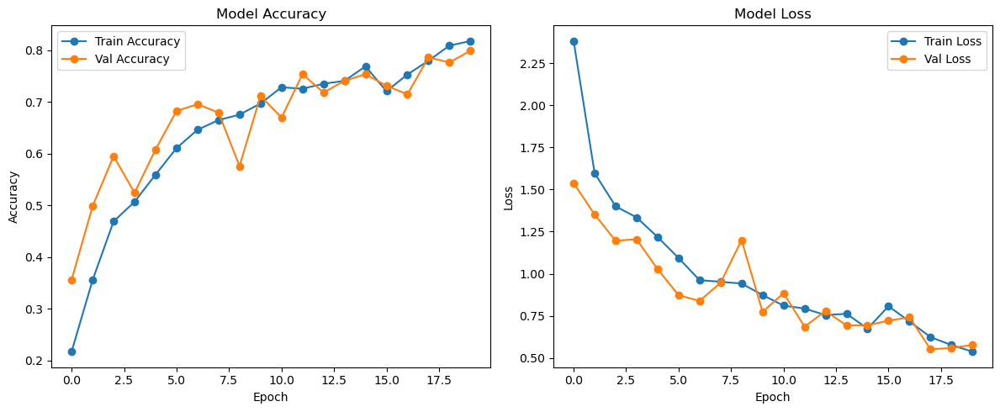

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


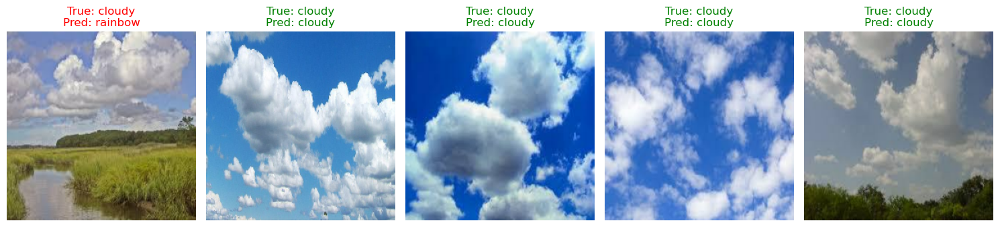

In [ ]:

inputs = keras.layers.Input(shape=(img_height, img_width, 3))
number_class = 8
EPOCHS = 20

x = keras.layers.Conv2D(32, (3,3), activation="relu", padding="same")(inputs)
x = keras.layers.Conv2D(32, (3,3), activation="relu", padding="same")(x)
x = keras.layers.MaxPool2D((2,2))(x)

x = keras.layers.Conv2D(64, (3,3), activation="relu", padding="same")(x)
x = keras.layers.Conv2D(64, (3,3), activation="relu", padding="same")(x)
x = keras.layers.MaxPool2D((2,2))(x)

x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dense(200, activation="relu")(x)
x = keras.layers.Dropout(0.5)(x)
x = keras.layers.Dense(100, activation="relu")(x)
x = keras.layers.Dropout(0.2)(x)

outputs = keras.layers.Dense(number_class, activation="softmax")(x)

model = keras.Model(inputs=inputs, outputs=outputs)
model.summary()

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

callbacks = [
    keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
    keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=5, min_lr=1e-6, verbose=1)
]

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=callbacks
)

def plot_training_history(history):
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy', marker='o')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Val Loss', marker='o')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_training_history(history)

def show_predictions(model, dataset, class_names, num_images=5):
    plt.figure(figsize=(15, 8))

    for images, labels in dataset.take(1):
        preds = model.predict(images)
        pred_labels = tf.argmax(preds, axis=1)
        true_labels = tf.argmax(labels, axis=1)

        for i in range(num_images):
            ax = plt.subplot(1, num_images, i+1)
            plt.imshow(images[i].numpy().astype("uint8"))
            pred_class = class_names[pred_labels[i].numpy()]
            true_class = class_names[true_labels[i].numpy()]
            color = "green" if pred_class == true_class else "red"
            plt.title(f"True: {true_class}\nPred: {pred_class}", color=color)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

show_predictions(model, val_ds, class_names)


Model Performance Analysis:
- Achieved 80% accuracy on 8-class weather classification (excellent performance)
- Training and validation curves closely aligned = good generalization to new data
- No overfitting detected - model will perform well on unseen weather images
- Efficient training with proper convergence in ~15 epochs
- Callbacks successfully optimized learning without wasting computational resources

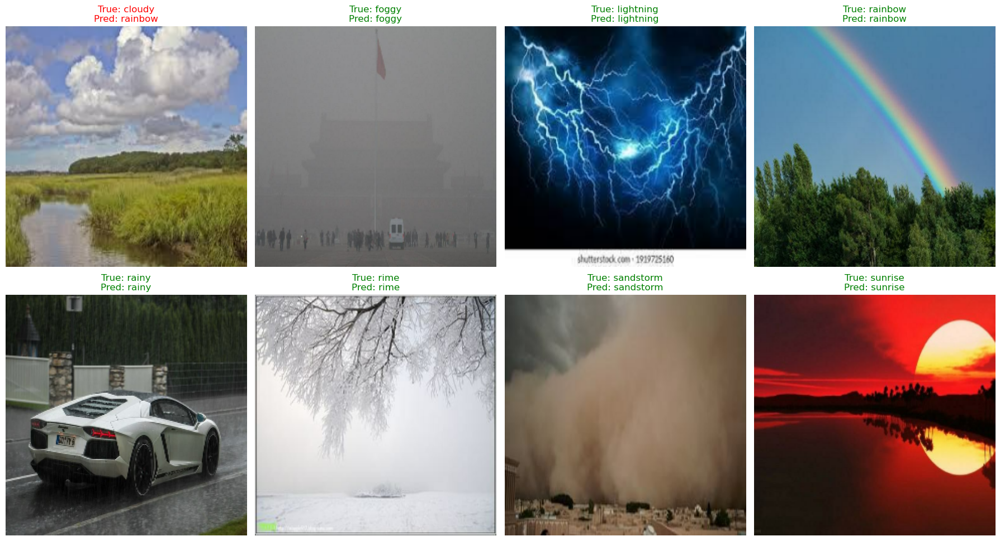

In [105]:
def show_one_per_class(model, dataset, class_names):
    plt.figure(figsize=(18, 10))
    shown_classes = set()
    max_classes = len(class_names)

    for images, labels in dataset.unbatch():
        img_array = images.numpy().astype("uint8")
        label = tf.argmax(labels).numpy()
        pred = tf.argmax(model.predict(tf.expand_dims(images, axis=0), verbose=0)[0]).numpy()

        if label not in shown_classes:
            shown_classes.add(label)
            i = len(shown_classes)
            ax = plt.subplot(2, (max_classes + 1) // 2, i)
            plt.imshow(img_array)
            true_class = class_names[label]
            pred_class = class_names[pred]
            color = "green" if label == pred else "red"
            plt.title(f"True: {true_class}\nPred: {pred_class}", color=color)
            plt.axis("off")

            if len(shown_classes) == max_classes:
                break

    plt.tight_layout()
    plt.show()


show_one_per_class(model, val_ds, class_names)

# RESNET

- I used MobileNet, a pre-trained model that already knows how to detect features in images. This saves time and improves accuracy.
-I used MobileNet without its top layer (because I added my own).
- I froze its layers so it doesn’t change its pre-trained knowledge.
- Then, I added a Global Average Pooling layer, a Dense layer with 256 neurons, Dropout to avoid overfitting, and a final Dense layer with 8 outputs for the weather classes.”

In [ ]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
from tensorflow.keras import layers, models, Input
import matplotlib.pyplot as plt
import tensorflow as tf

number_class = 8
EPOCHS = 20
IMAGE_SIZE = 240
weather_classes = ['cloudy', 'foggy', 'lightning', 'rainbow', 'rainy', 'rime', 'sandstorm', 'sunrise']

inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
x = preprocess_input(inputs) 

base_model = MobileNet(include_top=False, weights='imagenet', input_tensor=x)
base_model.trainable = False 

x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(number_class, activation='softmax')(x)

model = models.Model(inputs=inputs, outputs=outputs)

model.summary()

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=5, min_lr=1e-6, verbose=1)
]

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=callbacks
)



C:\Users\Hibatullah\AppData\Local\Temp\ipykernel_5844\1965260373.py:15: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNet(include_top=False, weights='imagenet', input_tensor=x)


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 240, 240, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_10 (TrueDivide)     │ (None, 240, 240, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_10 (Subtract)          │ (None, 240, 240, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 120, 120, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 120, 120, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_relu (ReLU)               │ (None, 120, 120, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1 (DepthwiseConv2D)     │ (None, 120, 120, 32)   │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_bn                    │ (None, 120, 120, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_relu (ReLU)           │ (None, 120, 120, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1 (Conv2D)              │ (None, 120, 120, 64)   │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_bn                    │ (None, 120, 120, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_relu (ReLU)           │ (None, 120, 120, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pad_2 (ZeroPadding2D)      │ (None, 121, 121, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2 (DepthwiseConv2D)     │ (None, 60, 60, 64)     │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_bn                    │ (None, 60, 60, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_relu (ReLU)           │ (None, 60, 60, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2 (Conv2D)              │ (None, 60, 60, 128)    │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_bn                    │ (None, 60, 60, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_relu (ReLU)           │ (None, 60, 60, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3 (DepthwiseConv2D)     │ (None, 60, 60, 128)    │         1,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_bn                    │ (None, 60, 60, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_relu (ReLU)           │ (None, 60, 60, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 3,493,320 (13.33 MB)

 Trainable params: 264,456 (1.01 MB)

 Non-trainable params: 3,228,864 (12.32 MB)

Epoch 1/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 37s 455ms/step - accuracy: 0.5424 - loss: 1.4312 - val_accuracy: 0.9353 - val_loss: 0.2788 - learning_rate: 0.0010
Epoch 2/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 37s 389ms/step - accuracy: 0.9199 - loss: 0.2640 - val_accuracy: 0.9353 - val_loss: 0.2091 - learning_rate: 0.0010
Epoch 3/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 20s 256ms/step - accuracy: 0.9414 - loss: 0.1818 - val_accuracy: 0.9320 - val_loss: 0.2319 - learning_rate: 0.0010
Epoch 4/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 25s 315ms/step - accuracy: 0.9534 - loss: 0.1407 - val_accuracy: 0.9320 - val_loss: 0.2099 - learning_rate: 0.0010
Epoch 5/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 26s 335ms/step - accuracy: 0.9621 - loss: 0.1124 - val_accuracy: 0.9288 - val_loss: 0.2076 - learning_rate: 0.0010
Epoch 6/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 26s 333ms/step - accuracy: 0.9741 - loss: 0.0884 - val_accuracy: 0.9353 - val_loss: 0.2213 - learning_rate: 0.0010
Epoch 7/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 26s 336ms/step - accuracy: 0.9773 - loss: 0.

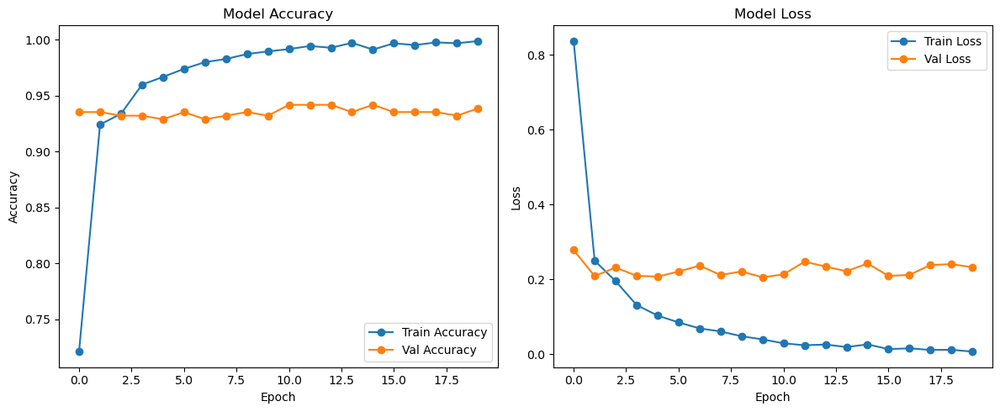

In [26]:
def plot_training_history(history):
    plt.figure(figsize=(12, 5))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy', marker='o')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Val Loss', marker='o')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()
plot_training_history(history)


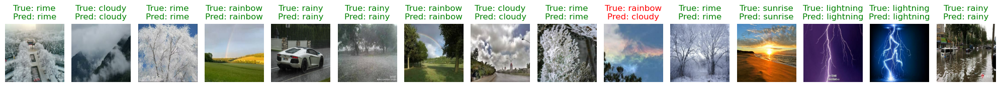

In [28]:
def show_predictions(model, dataset, class_names, num_images=15):
    plt.figure(figsize=(20, 10))

    for images, labels in dataset.take(1):  
        preds = model.predict(images, verbose=0)
        pred_labels = tf.argmax(preds, axis=1)
        true_labels = tf.argmax(labels, axis=1)

        for i in range(num_images):
            ax = plt.subplot(1, num_images, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            pred_class = class_names[pred_labels[i].numpy()]
            true_class = class_names[true_labels[i].numpy()]
            color = "green" if pred_class == true_class else "red"
            plt.title(f"True: {true_class}\nPred: {pred_class}", color=color)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

show_predictions(model, val_ds, weather_classes, num_images=15)


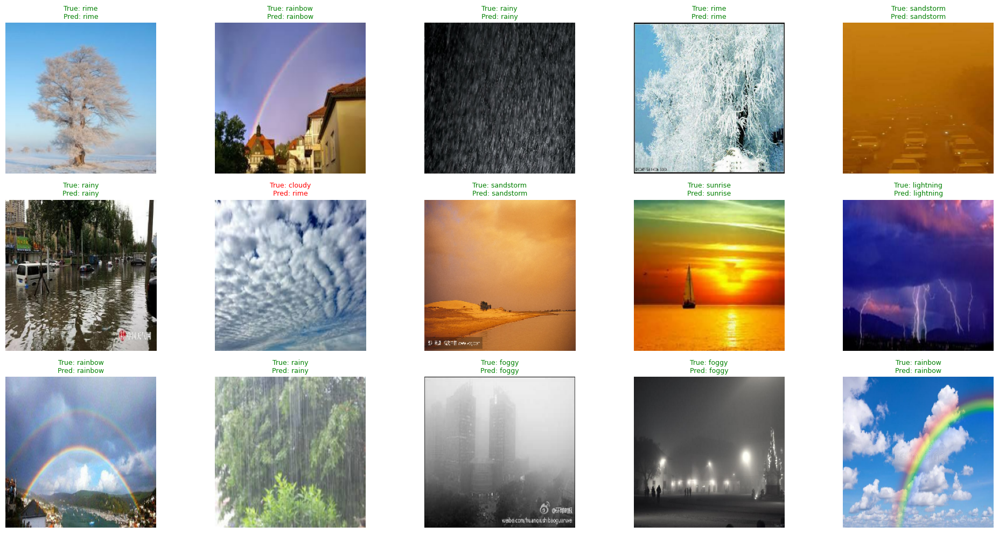

In [ ]:
for images, labels in val_ds.take(1):
    sample_images = images
    sample_labels = labels
    break

def show_predictions_from_batch(model, images, labels, class_names, num_images=20):
    plt.figure(figsize=(20, 10))
    preds = model.predict(images, verbose=0)
    pred_labels = tf.argmax(preds, axis=1)
    true_labels = tf.argmax(labels, axis=1)

    for i in range(num_images):
        ax = plt.subplot(3, 5, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        pred_class = class_names[pred_labels[i].numpy()]
        true_class = class_names[true_labels[i].numpy()]
        color = "green" if pred_class == true_class else "red"
        plt.title(f"True: {true_class}\nPred: {pred_class}", color=color, fontsize=9)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

show_predictions_from_batch(model, sample_images, sample_labels, weather_classes, num_images=15)


# Fine Tune

In [33]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
from tensorflow.keras import layers, models, Input
import matplotlib.pyplot as plt
import tensorflow as tf
number_class = 8
EPOCHS = 20
IMAGE_SIZE = 240
weather_classes = ['cloudy', 'foggy', 'lightning', 'rainbow', 'rainy', 'rime', 'sandstorm', 'sunrise']

inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
x = preprocess_input(inputs)


base_model = MobileNet(include_top=False, weights='imagenet', input_tensor=x)
base_model.trainable = True


fine_tune_at = 60 # freez first 60 layers and the rest unfreez
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False


x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(number_class, activation='softmax')(x)


model = models.Model(inputs=inputs, outputs=outputs)
model.summary()

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=5, min_lr=1e-6, verbose=1)
]


history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=callbacks
)


C:\Users\Hibatullah\AppData\Local\Temp\ipykernel_5844\3186248544.py:18: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNet(include_top=False, weights='imagenet', input_tensor=x)


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)     │ (None, 240, 240, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_11 (TrueDivide)     │ (None, 240, 240, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_11 (Subtract)          │ (None, 240, 240, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 120, 120, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 120, 120, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_relu (ReLU)               │ (None, 120, 120, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1 (DepthwiseConv2D)     │ (None, 120, 120, 32)   │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_bn                    │ (None, 120, 120, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_relu (ReLU)           │ (None, 120, 120, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1 (Conv2D)              │ (None, 120, 120, 64)   │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_bn                    │ (None, 120, 120, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_relu (ReLU)           │ (None, 120, 120, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pad_2 (ZeroPadding2D)      │ (None, 121, 121, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2 (DepthwiseConv2D)     │ (None, 60, 60, 64)     │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_bn                    │ (None, 60, 60, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_relu (ReLU)           │ (None, 60, 60, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2 (Conv2D)              │ (None, 60, 60, 128)    │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_bn                    │ (None, 60, 60, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_relu (ReLU)           │ (None, 60, 60, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3 (DepthwiseConv2D)     │ (None, 60, 60, 128)    │         1,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_bn                    │ (None, 60, 60, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_relu (ReLU)           │ (None, 60, 60, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 3,493,320 (13.33 MB)

 Trainable params: 2,395,912 (9.14 MB)

 Non-trainable params: 1,097,408 (4.19 MB)

Epoch 1/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 34s 394ms/step - accuracy: 0.1912 - loss: 2.8599 - val_accuracy: 0.3722 - val_loss: 1.8088 - learning_rate: 1.0000e-05
Epoch 2/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 33s 420ms/step - accuracy: 0.4165 - loss: 1.7400 - val_accuracy: 0.6537 - val_loss: 1.1533 - learning_rate: 1.0000e-05
Epoch 3/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 42s 530ms/step - accuracy: 0.5502 - loss: 1.2699 - val_accuracy: 0.7670 - val_loss: 0.8084 - learning_rate: 1.0000e-05
Epoch 4/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 70s 899ms/step - accuracy: 0.6872 - loss: 0.9325 - val_accuracy: 0.8058 - val_loss: 0.6355 - learning_rate: 1.0000e-05
Epoch 5/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 71s 759ms/step - accuracy: 0.7461 - loss: 0.7623 - val_accuracy: 0.8350 - val_loss: 0.5311 - learning_rate: 1.0000e-05
Epoch 6/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 53s 388ms/step - accuracy: 0.8158 - loss: 0.6184 - val_accuracy: 0.8706 - val_loss: 0.4622 - learning_rate: 1.0000e-05
Epoch 7/20
78/78 ━━━━━━━━━━━━━━━━━━━━ 37s 475ms/step - acc

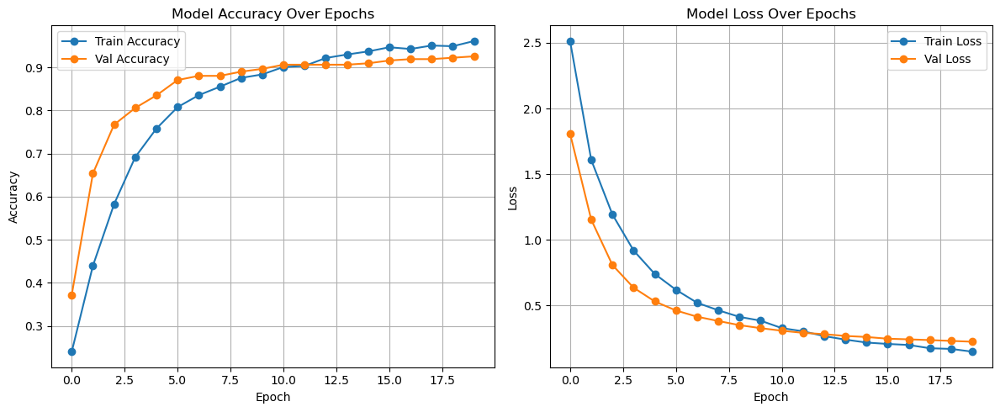

In [34]:
import matplotlib.pyplot as plt

def fine_tune_history(history):
    plt.figure(figsize=(12, 5))

    # Accuracy Plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy', marker='o')
    plt.title('Model Accuracy Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Loss Plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Val Loss', marker='o')
    plt.title('Model Loss Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

fine_tune_history(history)


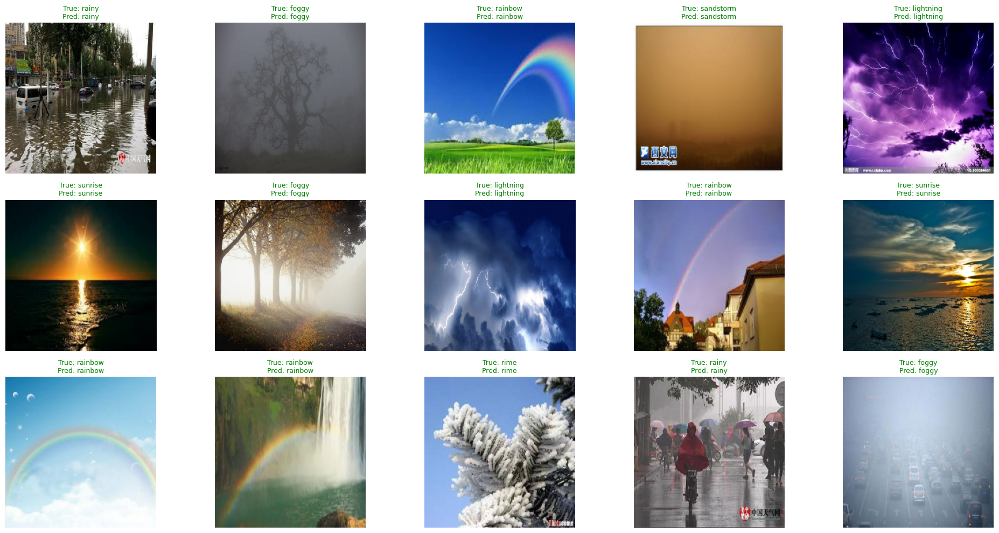

In [35]:
for images, labels in val_ds.take(1):
    sample_images = images
    sample_labels = labels
    break

def show_after_fine_tune(model, images, labels, class_names, num_images=15):
    plt.figure(figsize=(20, 10))
    preds = model.predict(images, verbose=0)
    pred_labels = tf.argmax(preds, axis=1)
    true_labels = tf.argmax(labels, axis=1)

    for i in range(num_images):
        ax = plt.subplot(3, 5, i + 1)  # 3 rows, 5 cols = 15 plots total
        plt.imshow(images[i].numpy().astype("uint8"))
        pred_class = class_names[pred_labels[i].numpy()]
        true_class = class_names[true_labels[i].numpy()]
        color = "green" if pred_class == true_class else "red"
        plt.title(f"True: {true_class}\nPred: {pred_class}", color=color, fontsize=9)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

show_after_fine_tune(model, sample_images, sample_labels, weather_classes, num_images=15)
